<h1>Import packages & prepare data</h1>

In [1]:
from scipy.io import netcdf
import similarity_measures as sim
import calculations as calc
import matplotlib as plt
import comparing as comp
import combining as comb
import plots
import numpy as np
from scipy.stats import entropy

In [2]:
plt.rcParams.update({'font.size': 30})

In [3]:
nc_l30 = netcdf.netcdf_file("data/era-int_pl_1979-2019-mm-l30-u.nc")

In [4]:
nc_l70 = netcdf.netcdf_file("data/era-int_pl_1979-2019-mm-l70-u.nc")

In [5]:
nc_l3 = netcdf.netcdf_file("data/era-int_pl_1979-2019-mm-l3-u.nc")

In [6]:
nc_l300 = netcdf.netcdf_file("data/era-int_pl_1979-2019-mm-l300-u.nc")

In [7]:
lon = calc.convert_coordinates_to_grid(nc_l30.variables["longitude"][:], 180)
lat = calc.convert_coordinates_to_grid(nc_l30.variables["latitude"][:], 0)

lon_step = 256 #Around the whole equator
lat_step = calc.convert_coordinates_to_grid(nc_l30.variables["latitude"][:], 0) - calc.convert_coordinates_to_grid(nc_l30.variables["latitude"][:], 5)


u_l30 = nc_l30.variables["u"]

#Deseasonalize
u_l30 = calc.deseasonalize_map(u_l30)

qbo_equator = calc.derive(u_l30[:, :, :, :], lat, lon, 0, lat_step, lon_step)

In [8]:
u_l70 = nc_l70.variables["u"]
u_l70 = calc.deseasonalize_map(u_l70)

In [9]:
u_l3 = nc_l3.variables["u"]
u_l3 = calc.deseasonalize_map(u_l3)

In [10]:
u_l300 = nc_l300.variables["u"]
u_l300 = calc.deseasonalize_map(u_l300)

<h1>Present similarity measures</h1>

In [11]:
measures = [sim.pearson_correlation, sim.mutual_information, sim.manhattan_distance, sim.transfer_entropy]

In [12]:
measure_labels=["Pearson's Correlation", "Mutual Information", "Manhattan Distance", "Transfer Entropy"]

In [13]:
#plots.plot_similarities(u_l30, qbo_equator, measures, measure_labels, scaling_func=comp.identity)

<h6>Similarities over time</h6>

In [14]:
#plots.plot_time_delayed_dependencies(u_l30, qbo_equator, [0, 1, 3, 6, 12], measures, measure_labels, scaling_func=comp.identity)

<h6>Similarities over different levels</h6>

In [15]:
datasets = [u_l3, u_l30, u_l70, u_l300]

In [16]:
dataset_labels = ["3 hPa", "30 hPa", "70 hPa", "300 hPa"]

In [17]:
#plots.plot_similarities_to_different_datasets(datasets, dataset_labels, qbo_equator, measures, measure_labels, scaling_func=comp.identity)

<h6>Similarities over different levels and time delays</h6>

In [18]:
#plots.plot_time_delayed_similarities_to_different_datasets(datasets, dataset_labels, qbo_equator, [0, 1, 3, 6, 12], sim.pearson_correlation_abs, scaling_func=comp.identity)

<h1>Comparing</h1>

In [19]:
measures = [sim.pearson_correlation_abs, sim.mutual_information, comp.invert(sim.manhattan_distance), comp.invert(sim.transfer_entropy)]

In [20]:
measure_labels=["Absolute Pearson's Correlation", "Mutual Information", "Inverted Manhattan Distance", "Inverted Transfer Entropy"]

<h3>Min-Max-Normalization</h3>

In [21]:
#plots.plot_similarities(u_l30, qbo_equator, measures, measure_labels, scaling_func=comp.min_max_normalization)

<h3>Binning to 10 quantiles</h3>

In [22]:
#plots.plot_similarities(u_l30, qbo_equator, measures, measure_labels, scaling_func=comp.binning_values_to_quantiles)

<h3>Binning to 100 quantiles</h3>

In [23]:
#plots.plot_similarities(u_l30, qbo_equator, measures, measure_labels, scaling_func=comp.binning_to_100_bins)

<h3>Binning to 1000 quantiles</h3>

In [24]:
#plots.plot_similarities(u_l30, qbo_equator, measures, measure_labels, scaling_func=comp.binning_to_1000_bins)

<h3>Histogram Equalization</h3>

In [25]:
#plots.plot_similarities(u_l30, qbo_equator, measures, measure_labels, scaling_func=comp.equalize_histogram)

<h1>Combining</h1>

<h3>Combining by summing up</h3>

In [26]:
combination_func = comb.sum

In [27]:
#plots.plot_similarity_measures_combinations(u_l30, qbo_equator, combination_func, measures, measure_labels, scaling_func=comp.binning_to_100_bins)

<h3>Combining by multiplying</h3>

In [28]:
combination_func = comb.mult

In [29]:
#plots.plot_similarity_measures_combinations(u_l30, qbo_equator, combination_func, measures, measure_labels, scaling_func=comp.binning_to_100_bins)

<h3>Combining by mean</h3>

In [30]:
combination_func = comb.mean

In [31]:
#plots.plot_similarity_measures_combinations(u_l30, qbo_equator, combination_func, measures, measure_labels, scaling_func=comp.binning_to_100_bins)

<h3>Combining by max</h3>

In [32]:
combination_func = comb.max

In [33]:
#plots.plot_similarity_measures_combinations(u_l30, qbo_equator, combination_func, measures, measure_labels, scaling_func=comp.binning_to_100_bins)

<h3>Combining by multiplying, sign of Pearson</h3>

In [34]:
measures = [sim.pearson_correlation, sim.mutual_information, comp.invert(sim.manhattan_distance), comp.invert(sim.transfer_entropy)]

In [35]:
measure_labels=["Pearson's Correlation", "Mutual Information", "Inverted Manhattan Distance", "Inverted Transfer Entropy"]

In [36]:
combination_func=comb.mult

In [37]:
#plots.plot_sign_of_correlation_strength_of_all(u_l30, qbo_equator, combination_func, measures, measure_labels)

<h3>Combining by mean, sign of Pearson</h3>

In [38]:
combination_func=comb.mean

In [39]:
#plots.plot_sign_of_correlation_strength_of_all(u_l30, qbo_equator, combination_func, measures, measure_labels)

<h1>Agreeableness</h1>

<h3>Areas where similarity measures agree (based on std) there is high similarity</h3>

In [40]:
measures = [sim.pearson_correlation_abs, sim.mutual_information, comp.invert(sim.manhattan_distance), comp.invert(sim.transfer_entropy)]

In [41]:
measure_labels=["Pearson's Correlation", "Mutual Information", "Manhattan Distance", "Transfer Entropy"]

In [42]:
agreement_func = np.std #Standard Deviation

In [47]:
value_thresholds = [0.5, 0.6, 0.7, 0.8]

In [48]:
agreement_thresholds = [1, 0.5, 0.2, 0.1]

In [49]:
scaling = comp.binning_to_100_bins

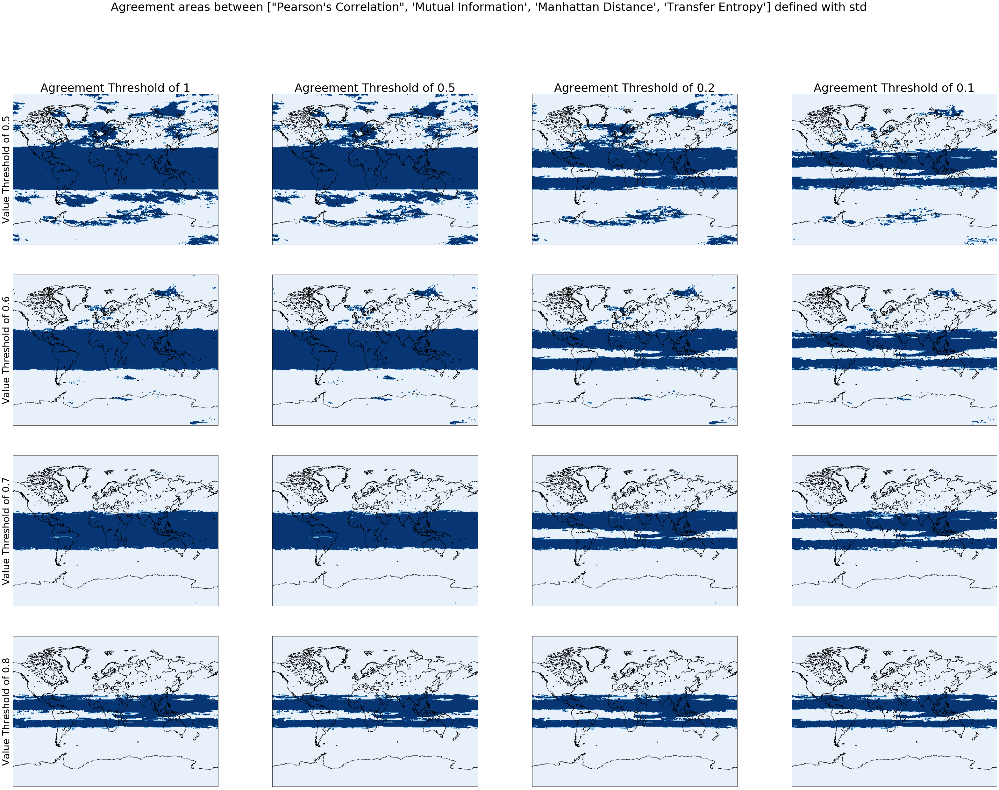

In [50]:
plots.plot_agreement_areas_defined_with(u_l30, qbo_equator, measures, measure_labels, agreement_func, value_thresholds, agreement_thresholds, scaling_func=scaling)

<h3>Areas where similarity measures agree (based on std) there is low similarity</h3>

In [54]:
value_thresholds = [0.5, 0.4, 0.3, 0.2]

In [55]:
agreement_thresholds = [0.4, 0.3, 0.2, 0.1]

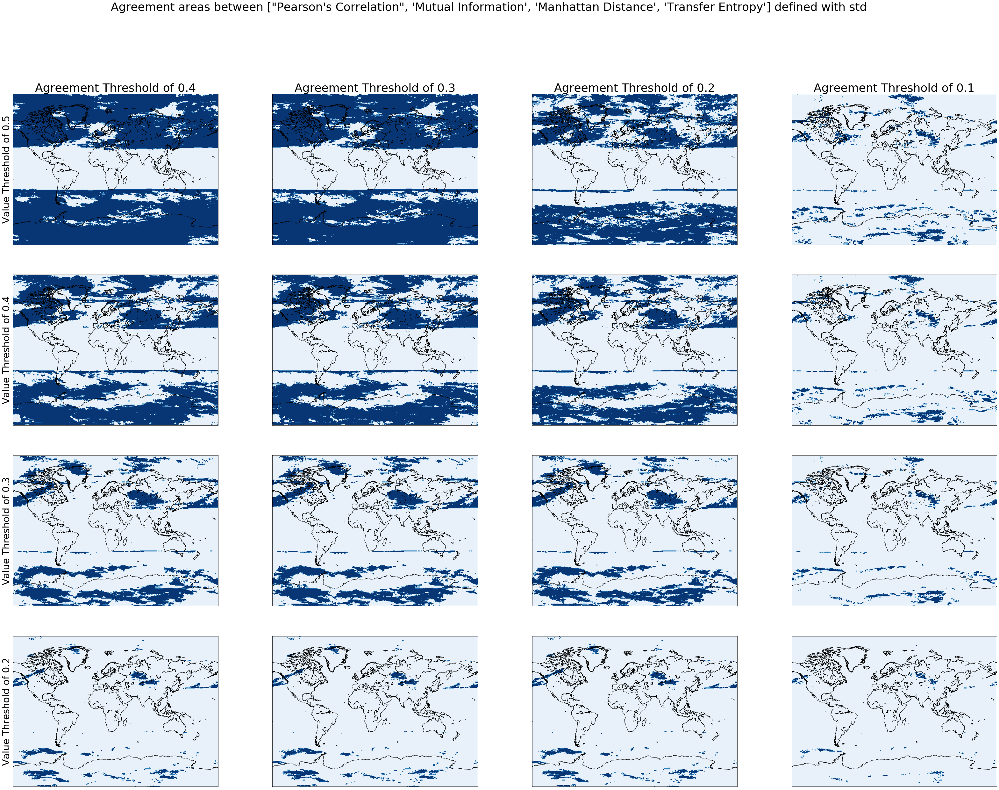

In [56]:
plots.plot_agreement_areas_defined_with(u_l30, qbo_equator, measures, measure_labels, agreement_func, value_thresholds, agreement_thresholds, filter_values_high=False, scaling_func=scaling)

<h3>Areas where similarity measures agree (based on entropy) there is high similarity</h3>

In [57]:
agreement_func = entropy

In [58]:
value_thresholds = [0.6, 0.7, 0.8, 0.9]

In [72]:
agreement_thresholds = [1.2, 1.25, 1.3, 1.35]

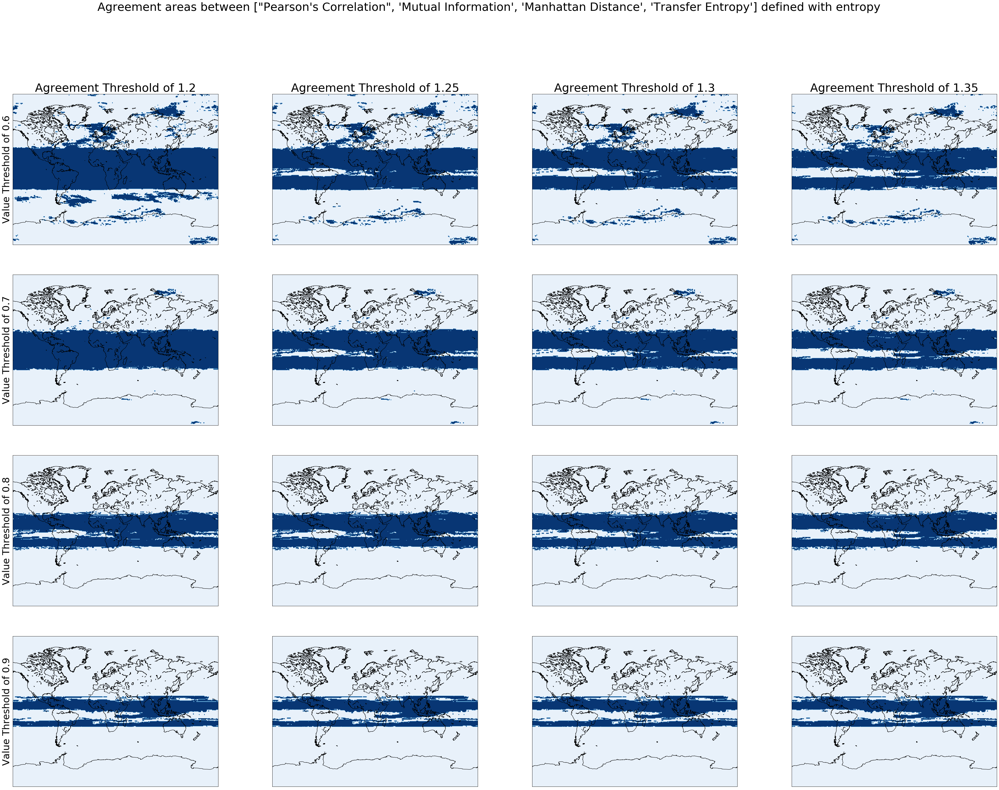

In [73]:
plots.plot_agreement_areas_defined_with(u_l30, qbo_equator, measures, measure_labels, agreement_func, value_thresholds, agreement_thresholds, filter_agreement_high=True)

<h1>Agreeableness over different levels and time</h1>

<h3>With std</h3>

In [78]:
agreement = np.std

In [79]:
value_threshold = 0.6

In [80]:
agreement_threshold = 0.2

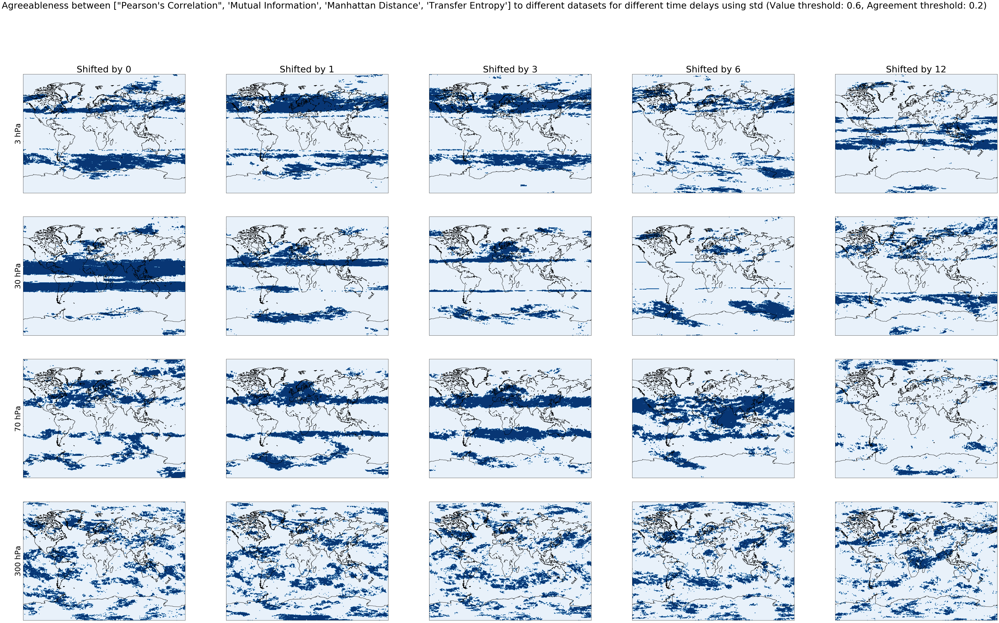

In [81]:
plots.plot_time_delayed_agreeableness_to_different_datasets(datasets, dataset_labels, qbo_equator, [0, 1, 3, 6, 12], measures, measure_labels, value_threshold=value_threshold, agreement_threshold=agreement_threshold,agreement_func=agreement)

<h3>With entropy</h3>

In [82]:
agreement = entropy

In [83]:
agreement_threshold = 1.3

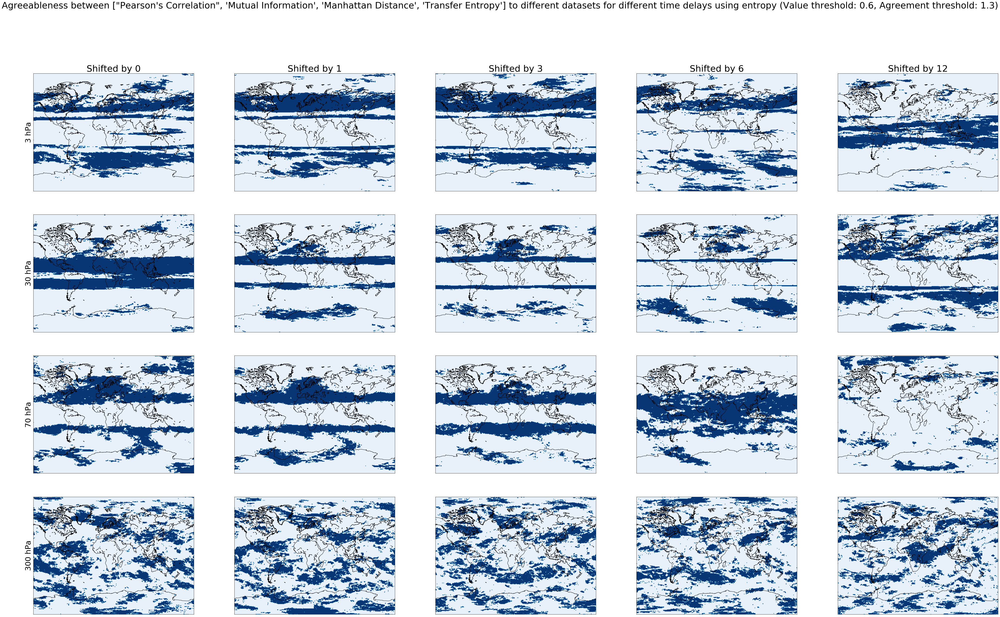

In [85]:
plots.plot_time_delayed_agreeableness_to_different_datasets(datasets, dataset_labels, qbo_equator, [0, 1, 3, 6, 12], measures, measure_labels, value_threshold=value_threshold, agreement_threshold=agreement_threshold,agreement_func=agreement, filter_agreement_high=True)

<h1>Apply masks on other maps</h1>

In [95]:
value_threshold = 0.6

In [96]:
agreement_threshold = 0.2

In [97]:
agreement_func = np.std

In [98]:
combination_func = np.mean

In [99]:
scaling = comp.binning_to_100_bins

In [100]:
mask = calc.calculate_filtered_agreement_areas(u_l30, qbo_equator, measures, value_threshold, agreement_threshold, combination_func=combination_func, agreement_func=agreement_func, scaling_func=scaling)

In [101]:
pearson_map = calc.calculate_series_similarity(u_l30, qbo_equator, sim_func=sim.pearson_correlation)

In [102]:
filtered_pearson_map = calc.apply_mask_on_map(pearson_map, mask)

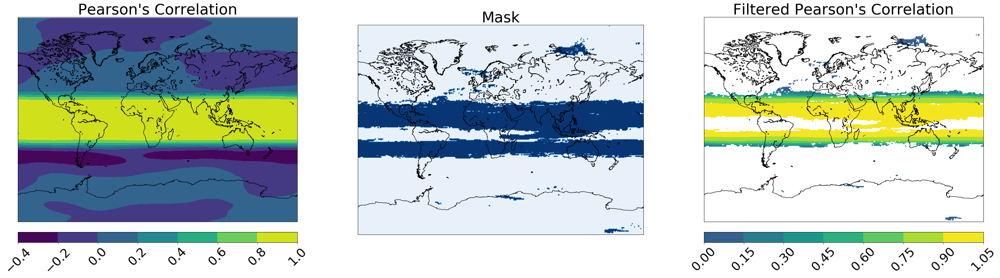

In [104]:
fig, ax = plt.pyplot.subplots(1, 3, figsize=(42, 10))
plots.plot_map(pearson_map, ax[0])
plots.plot_map(mask, ax[1], cmap=plt.cm.get_cmap("Blues"), colorbar=False)
plots.plot_map(filtered_pearson_map, ax[2], overwrite_colorbar_boundaries=True, colorbar_min=np.min(pearson_map), colorbar_max=1)
titles = ["Pearson's Correlation", "Mask", "Filtered Pearson's Correlation"]
plots.annotate(ax, column_labels=titles, column_count=3)